# Chapter 25: Plotting with Dataframes

In [1]:
import pandas as pd
import numpy as np

url = 'https://github.com/mattharrison/datasets/raw/master/data/siena2018-pres.csv'
df = pd.read_csv(url, index_col=0)

In [2]:
def tweak_siena_pres(df):
    def int64_to_uint8(df_):
        cols = df_.select_dtypes('int64')
        return (df_
                .astype({col:'uint8' for col in cols}))


    return (df
     .rename(columns={'Seq.':'Seq'})    # 1 removes period from column name Eq.
     .rename(columns={k:v.replace(' ', '_') for k,v in
        {'Bg': 'Background',
         'PL': 'Party leadership', 'CAb': 'Communication ability',
         'RC': 'Relations with Congress', 'CAp': 'Court appointments',
         'HE': 'Handling of economy', 'L': 'Luck',
         'AC': 'Ability to compromise', 'WR': 'Willing to take risks',
         'EAp': 'Executive appointments', 'OA': 'Overall ability',
         'Im': 'Imagination', 'DA': 'Domestic accomplishments',
         'Int': 'Integrity', 'EAb': 'Executive ability',
         'FPA': 'Foreign policy accomplishments',
         'LA': 'Leadership ability',
         'IQ': 'Intelligence', 'AM': 'Avoid crucial mistakes',
         'EV': "Experts' view", 'O': 'Overall'}.items()})
     .astype({'Party':'category'})  # 2 sets the type of Party column to category
     .pipe(int64_to_uint8)  # 3 converts all the int64 columns to unsigned 8-bit columns
     .assign(Average_rank=lambda df_:(df_.select_dtypes('uint8') # 4 creates am average_rank column
                 .sum(axis=1).rank(method='dense').astype('uint8')),
             Quartile=lambda df_:pd.qcut(df_.Average_rank, 4,
                 labels='1st 2nd 3rd 4th'.split())
            )
    )

In [4]:
pres = tweak_siena_pres(df)
pres.head()

,Seq,President,Party,Background,Imagination,Integrity,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,Foreign_policy_accomplishments,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
1,1,George Washington,Independent,7,7,1,10,1,6,2,...,1,1,1,2,2,1,2,1,1,1st
2,2,John Adams,Federalist,3,13,4,4,24,14,31,...,4,13,15,19,13,16,10,14,13,2nd
3,3,Thomas Jefferson,Democratic-Republican,2,2,14,1,8,5,14,...,7,20,4,6,9,7,5,5,5,1st
4,4,James Madison,Democratic-Republican,4,6,7,3,16,15,6,...,6,14,7,11,19,11,8,7,7,1st
5,5,James Monroe,Democratic-Republican,9,14,11,18,6,16,7,...,11,9,9,10,5,6,9,8,8,1st


## 25.1 Lines Plots

In [6]:
(pres
 .set_index('President')
 .head()
 )

,Seq,Party,Background,Imagination,Integrity,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,Executive_ability,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,Foreign_policy_accomplishments,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
President,,,,,,,,,,,,,,,,,,,,,
George Washington,1,Independent,7,7,1,10,1,6,2,2,...,1,1,1,2,2,1,2,1,1,1st
John Adams,2,Federalist,3,13,4,4,24,14,31,21,...,4,13,15,19,13,16,10,14,13,2nd
Thomas Jefferson,3,Democratic-Republican,2,2,14,1,8,5,14,6,...,7,20,4,6,9,7,5,5,5,1st
James Madison,4,Democratic-Republican,4,6,7,3,16,15,6,13,...,6,14,7,11,19,11,8,7,7,1st
James Monroe,5,Democratic-Republican,9,14,11,18,6,16,7,10,...,11,9,9,10,5,6,9,8,8,1st


In [11]:
# filter out the columns we want
(pres
 .set_index('President')
 .loc[::2, 'Background':'Overall']
 .T)

President,George Washington,Thomas Jefferson,James Monroe,Andrew Jackson,William Henry Harrison,James K. Polk,Millard Fillmore,James Buchanan,Andrew Johnson,Rutherford B. Hayes,...,Theodore Roosevelt,Woodrow Wilson,Calvin Coolidge,Franklin D. Roosevelt,Dwight D. Eisenhower,Lyndon B. Johnson,Gerald Ford,Ronald Reagan,Bill Clinton,Barack Obama
Background,7,2,9,37,22,19,40,36,42,35,...,5,8,32,6,11,15,18,27,21,24
Imagination,7,2,14,15,38,10,37,43,42,30,...,4,8,36,3,18,11,32,17,12,11
Integrity,1,14,11,29,28,23,36,40,41,32,...,8,19,17,16,5,34,10,24,39,13
Intelligence,10,1,18,28,37,23,38,39,42,29,...,6,7,33,12,17,22,30,31,8,9
Luck,1,8,6,4,44,9,35,42,40,23,...,2,14,13,5,7,25,30,3,11,15
Willing_to_take_risks,6,5,16,4,32,7,38,41,34,35,...,2,11,39,3,21,10,29,13,17,23
Ability_to_compromise,2,14,7,38,41,18,32,40,43,23,...,15,35,27,4,5,9,11,10,3,16
Executive_ability,2,6,10,11,38,7,37,42,43,33,...,4,14,32,3,5,9,31,15,16,18
Leadership_ability,1,6,12,9,29,11,39,44,43,33,...,4,14,38,3,5,13,30,7,15,16
Communication_ability,11,4,15,18,31,16,40,42,44,30,...,5,7,37,2,20,17,33,6,8,9


Text(0, 0.5, 'Rank')

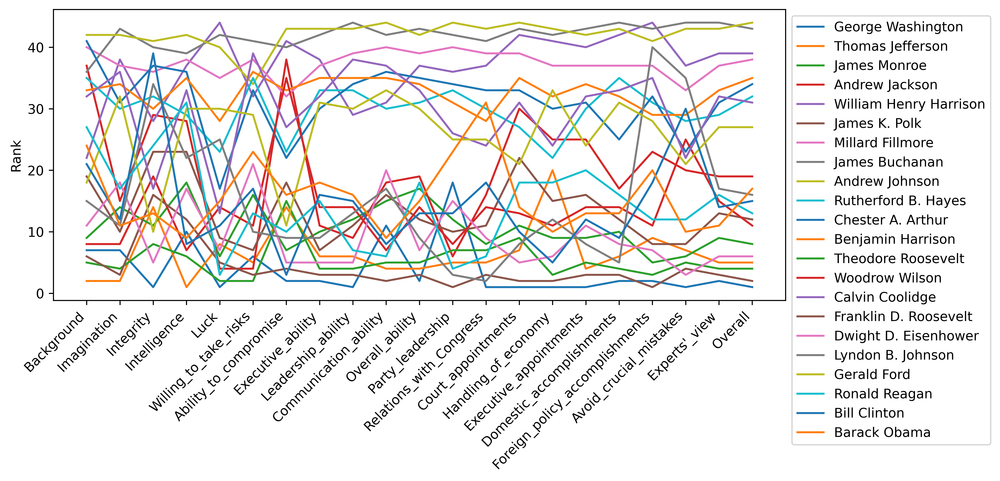

In [19]:
# plot
import matplotlib.pyplot as plt

fig, ax = plt.subplots(dpi=600, figsize=(10,4))
(pres
 .set_index('President')
 .loc[::2, 'Background':'Overall']
 .T
 .plot(ax=ax, rot=45).legend(bbox_to_anchor=(1,1))
 )

ax.set_xticks(range(21))
ax.set_xticklabels(pres
                .loc[:, 'Background':'Overall'].columns, ha='right')
ax.set_ylabel('Rank')

- Generally, we want to pull attention to a single line. In this example, we will highlight Washington.
- We can use ``.pipe`` method to create a colors list to indicate the colors for each line

In [22]:
def set_colors(df):
    for col in df.columns:
        if 'George' in col:
            colors.append('#990000')
        else:
            colors.append('#999999')
    return df

Text(0, 0.5, 'Rank')

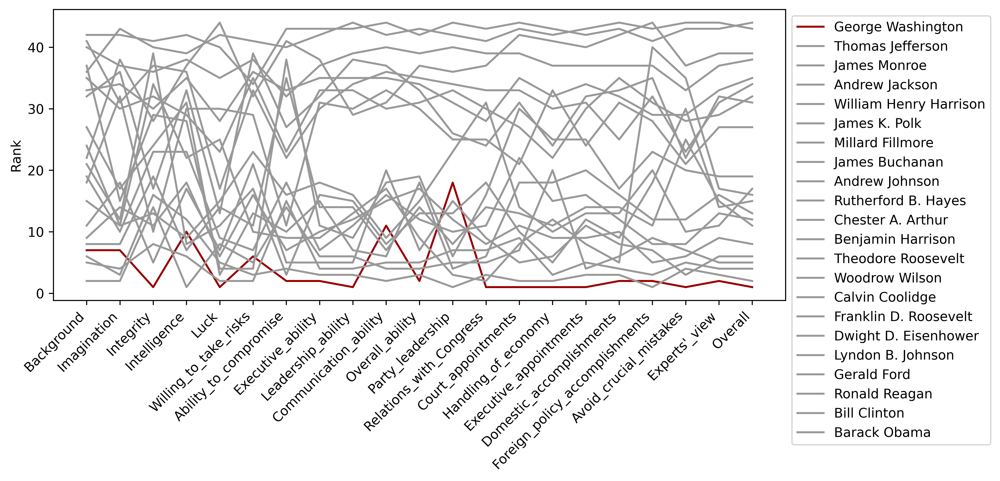

In [24]:
fig, ax = plt.subplots(dpi=600, figsize=(10,4))
colors = []

(pres
 .set_index('President')
 .loc[::2, 'Background':'Overall']
 .T
 .pipe(set_colors)
 .plot(ax=ax, rot=45, color=colors)
 .legend(bbox_to_anchor=(1,1))
 )

ax.set_xticks(range(21))
ax.set_xticklabels(pres
                .loc[:, 'Background':'Overall'].columns, ha='right')
ax.set_ylabel('Rank')

## 25.2 Bar Plots

- We will make a bar plot comparing 4 attributes for each president

In [26]:
(pres
 .set_index('President')
 .iloc[:, -5:-1]
 .head()
 )

,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank
President,,,,
George Washington,1,2,1,1
John Adams,16,10,14,13
Thomas Jefferson,7,5,5,5
James Madison,11,8,7,7
James Monroe,6,9,8,8


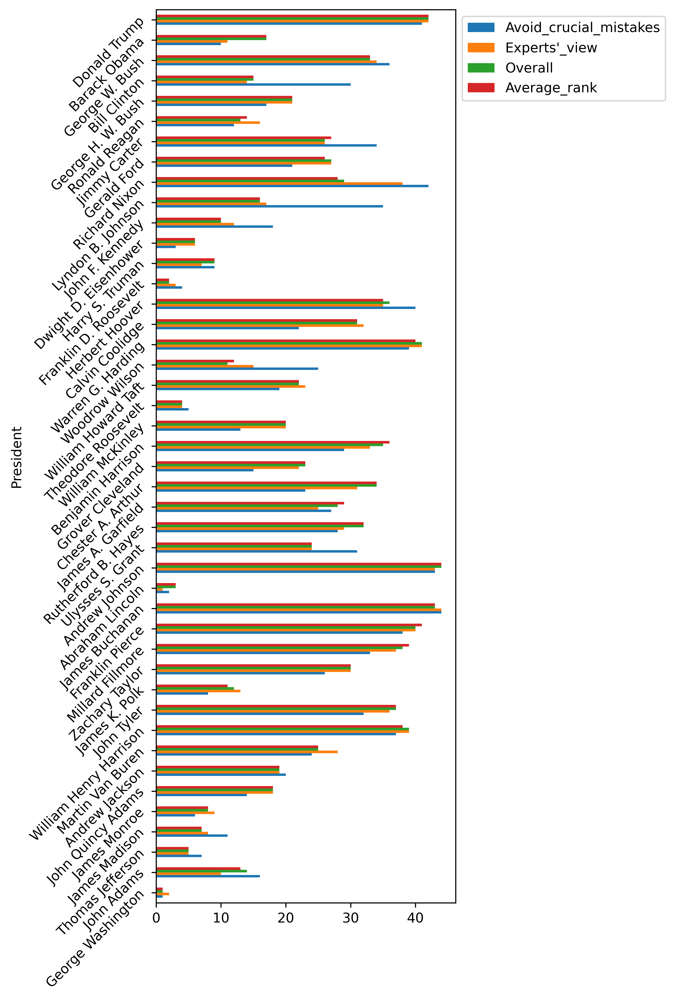

In [35]:
fig, ax = plt.subplots(dpi=600, figsize=(10,4))
(pres
 .set_index('President')
 .iloc[:, -5:-1]
 .plot.barh(rot=45, figsize=(4,12), ax=ax)
 .legend(bbox_to_anchor=(1,1))
)

## 25.3 Scatter Plots

- A scatter plot is useful to determine the relationship between two columns that are numeric
- We can evaluate what tends to happen to one value as the other value changes

<AxesSubplot: xlabel='Integrity', ylabel='Avoid_crucial_mistakes'>

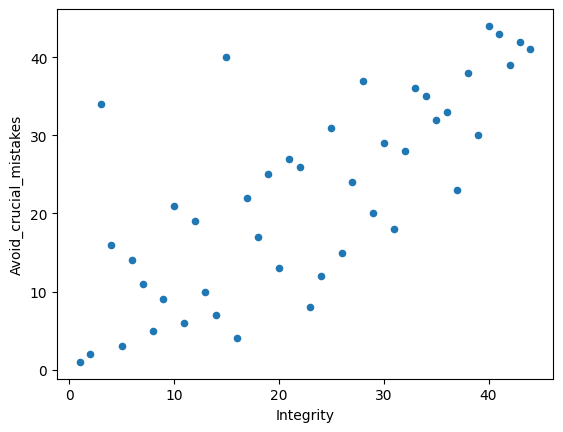

In [36]:
(pres
 .plot.scatter(x='Integrity', y='Avoid_crucial_mistakes')
)

- We can use pearson correlation coefficient to check.
- It appears that as the rank for integrity falls, so does the rank for avoiding crucial mistakes.

In [37]:
pres.Integrity.corr(pres.Avoid_crucial_mistakes)

0.7455954897815362

<AxesSubplot: xlabel='Integrity', ylabel='Avoid_crucial_mistakes'>

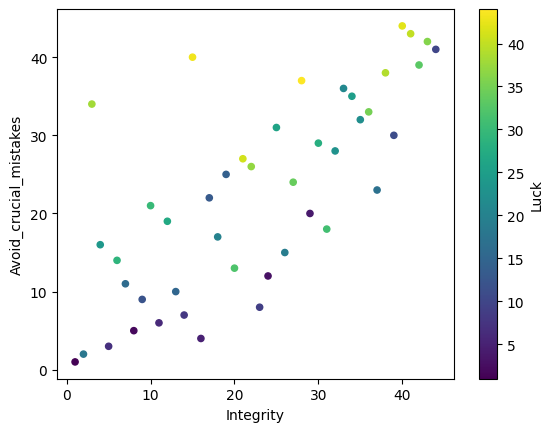

In [38]:
# add another dimensions and color by them
(pres
 .plot.scatter(x='Integrity', y='Avoid_crucial_mistakes',
               c='Luck', cmap='viridis')
)

- Another mechanism to visualize relationships between two continuous values as well as density (where the values overlap), is a hexbin plot

<AxesSubplot: xlabel='Integrity', ylabel='Avoid_crucial_mistakes'>

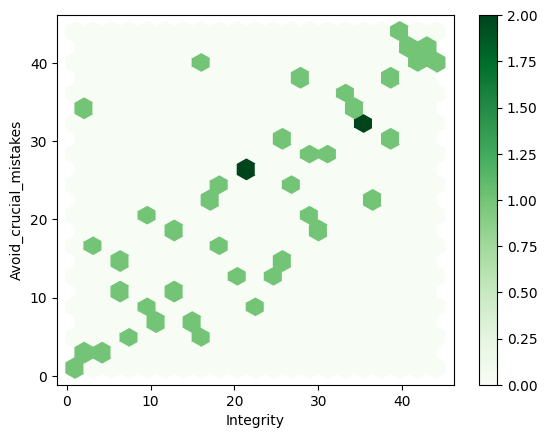

In [43]:
(pres
 .plot.hexbin(x='Integrity', y='Avoid_crucial_mistakes', gridsize=20,
              cmap='Greens')
)

## 25.4 Area Plots and Stacked Bar Plots

- A dataframe can create stacked area plots with the ``.area`` method
- This is useful when we want to understand each column's relative contribution and the other of the data is important.
- Area: If there is relationship and order between values
- Stacked Bar Plots: If there is no relationship and order between values

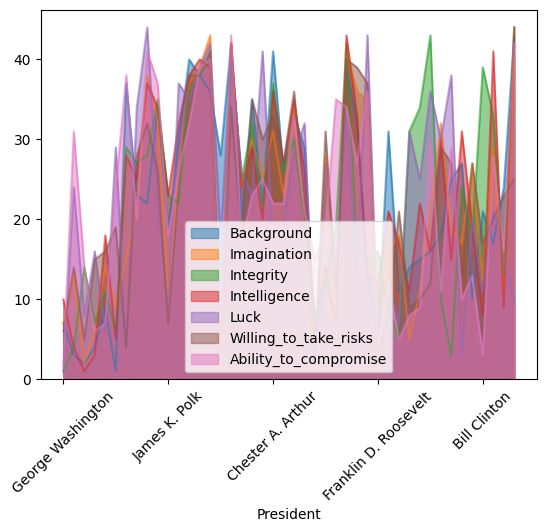

In [48]:
# area
(pres
 .plot.area(x='President',
            y='Background Imagination Integrity Intelligence Luck Willing_to_take_risks Ability_to_compromise'.split(),
            rot=45,
            stacked=False)
)

ax.set_xticks(range(len(pres)))
ax.set_xticklabels(labels=pres.President, ha='right')

plt.show()

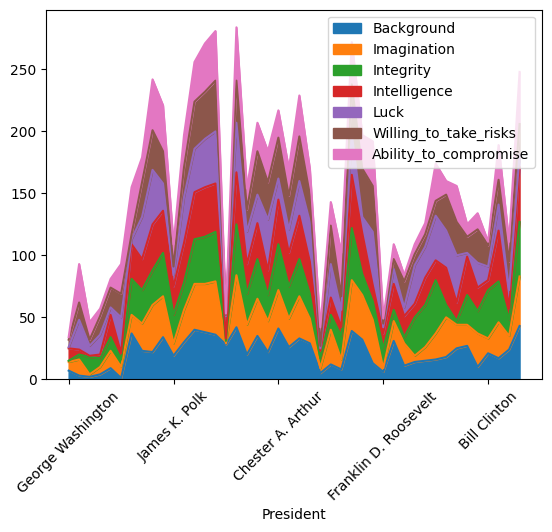

In [47]:
# stacked area chart
(pres
 .plot.area(x='President',
            y='Background Imagination Integrity Intelligence Luck Willing_to_take_risks Ability_to_compromise'.split(),
            rot=45,
            stacked=True)
)

ax.set_xticks(range(len(pres)))
ax.set_xticklabels(labels=pres.President, ha='right')

plt.show()

## 25.5 Column Distributions with KDEs, Histograms, and Boxplots

- We can run summary statistics if we have numeric information in our columns using ``.describe`` method.
- To visualize the distribution for each column, we can use ``.hist`` or ``.density`` method

In [50]:
# describe
(pres
 .set_index('President')
 .loc[:, 'Background':'Average_rank']
 .iloc[:9]
 .T
 .describe()
)

President,George Washington,John Adams,Thomas Jefferson,James Madison,James Monroe,John Quincy Adams,Andrew Jackson,Martin Van Buren,William Henry Harrison
count,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000
mean,3.681818,14.454545,6.545455,9.636364,10.454545,17.181818,19.590909,25.681818,36.909091
std,4.444219,7.544959,4.404838,4.392043,3.634848,7.538071,9.465019,3.721064,5.485124
min,1.000000,3.000000,1.000000,3.000000,5.000000,1.000000,4.000000,16.000000,22.000000
25%,1.000000,10.750000,4.250000,6.250000,8.000000,14.250000,15.250000,24.250000,36.250000
50%,2.000000,13.500000,5.000000,8.500000,9.500000,18.000000,19.000000,25.500000,38.000000
75%,5.000000,18.500000,7.000000,12.500000,12.000000,21.750000,25.000000,27.750000,40.750000
max,18.000000,31.000000,20.000000,19.000000,18.000000,29.000000,38.000000,34.000000,44.000000


<AxesSubplot: ylabel='Density'>

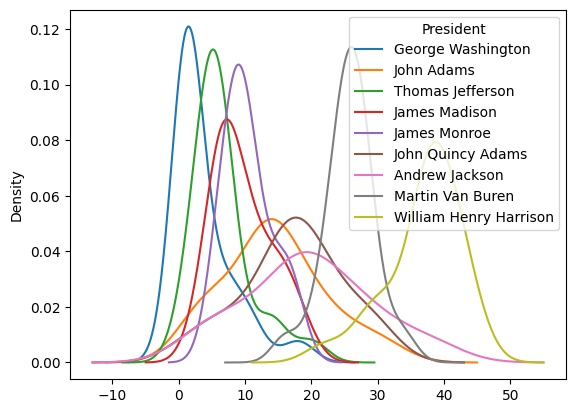

In [51]:
# density
(pres
 .set_index('President')
 .loc[:, 'Background':'Average_rank']
 .iloc[:9]
 .T
 .plot.density()
)

<AxesSubplot: ylabel='Frequency'>

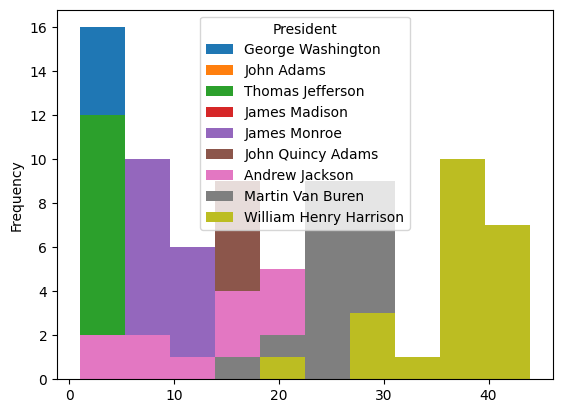

In [52]:
# histogram
(pres
 .set_index('President')
 .loc[:, 'Background':'Average_rank']
 .iloc[:9]
 .T
 .plot.hist()
)

<AxesSubplot: >

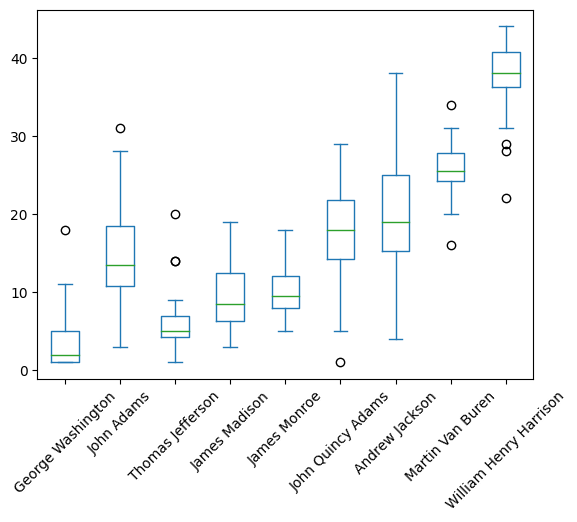

In [59]:
# boxplot
(pres
 .set_index('President')
 .loc[:, 'Background':'Average_rank']
 .iloc[:9]
 .T
 .plot.box(rot=45)
)
